# Clustering of the AirBNB Data

In [ ]:
pip install geopandas

In [ ]:
# Import the required packages
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd

In [ ]:
import shapely
import numpy as np
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
import folium

**1. *Importing the Data***

In [ ]:
df = pd.read_csv("https://github.com/BankNatchapol/SuperAIEngineer/raw/master/week2/datasets/AB_NYC_2019.csv")

**2. *Cleaning the Data***

In [ ]:
## Checking the data types
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [ ]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [ ]:
## id, last_review, reviews_per_month columns can be dropped

df.drop(['id','host_name','last_review', 'reviews_per_month'], axis=1, inplace=True)

**3. *Analysing the Data***

In [ ]:
# Checking the categories of each column 
df['room_type'].unique()
df['neighbourhood_group'].unique()
df['neighbourhood'].unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

In [ ]:
df['price'].describe()

count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

In [ ]:
df['minimum_nights'].describe()

count    48895.000000
mean         7.029962
std         20.510550
min          1.000000
25%          1.000000
50%          3.000000
75%          5.000000
max       1250.000000
Name: minimum_nights, dtype: float64

In [ ]:
df['number_of_reviews'].describe()

count    48895.000000
mean        23.274466
std         44.550582
min          0.000000
25%          1.000000
50%          5.000000
75%         24.000000
max        629.000000
Name: number_of_reviews, dtype: float64

**4. *Feature Engineering***

Whats in the Name ?

In [ ]:
## Seperating the first and the last word from the name of the property

df['last'] = df["name"].apply(lambda x: str(x).split()[-1])
df['first'] = df["name"].apply(lambda x: str(x).split()[0])

**5. *Data Visualisation***

Neighbourhood Analysis

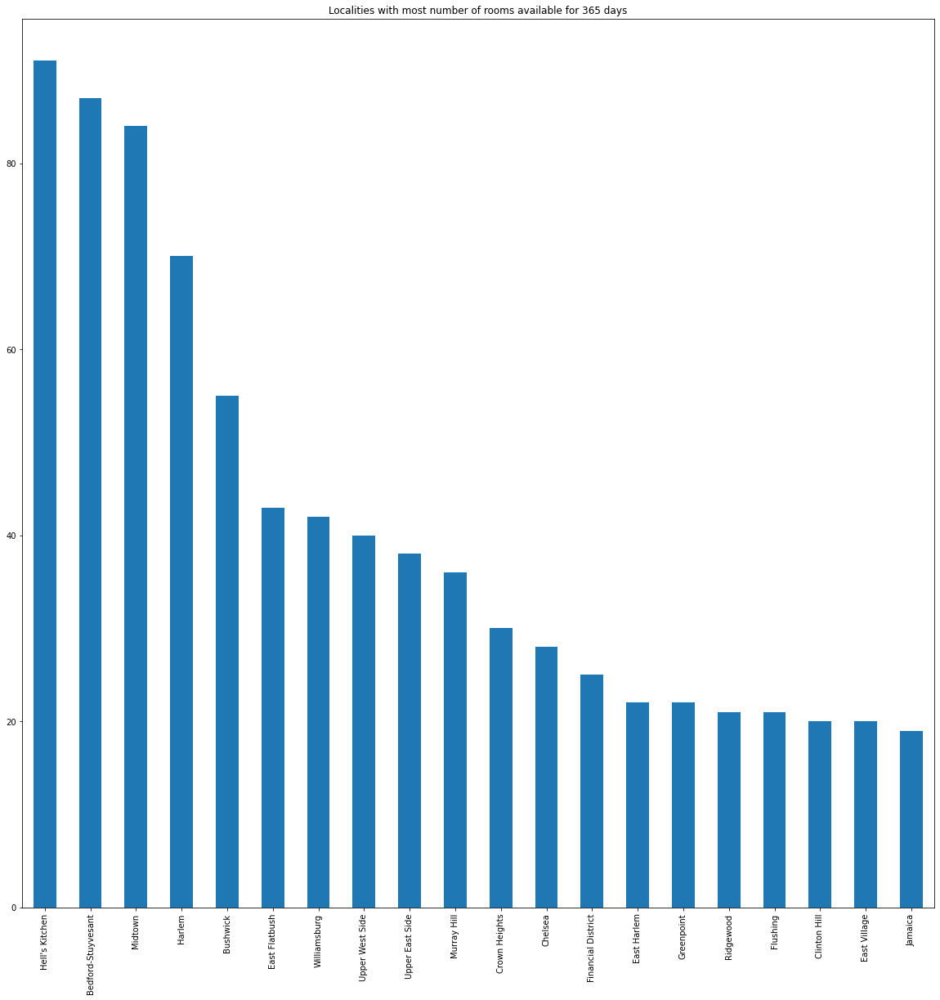

In [ ]:
## Areas with most rooms available for 365 days

a365 = df[df['availability_365'] == 365]
a365 = a365['neighbourhood'].value_counts()
(a365.head(n = 20)).plot.bar(figsize =(20, 20), title = "Localities with most number of rooms available for 365 days")

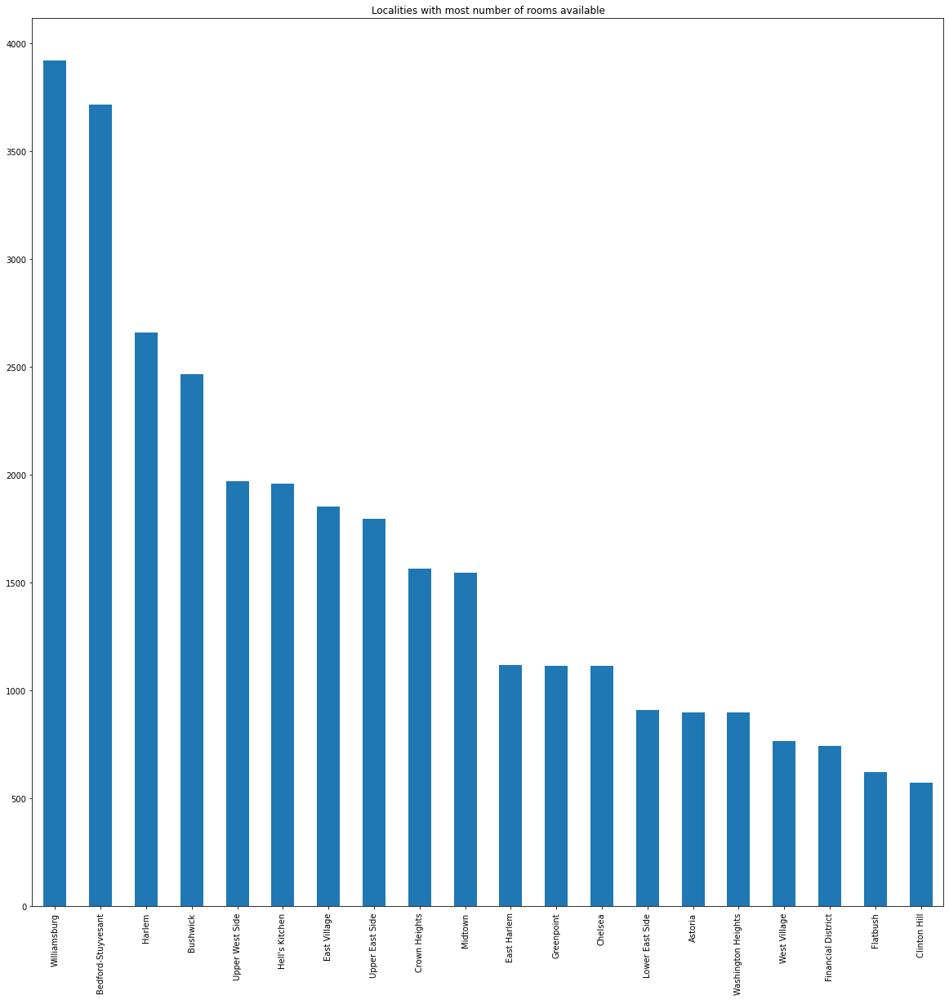

In [ ]:
# Neighborhoods with most places for rent
count = df['neighbourhood'].value_counts()
(count.head(n = 20)).plot.bar(figsize =(20, 20), title = "Localities with most number of rooms available")

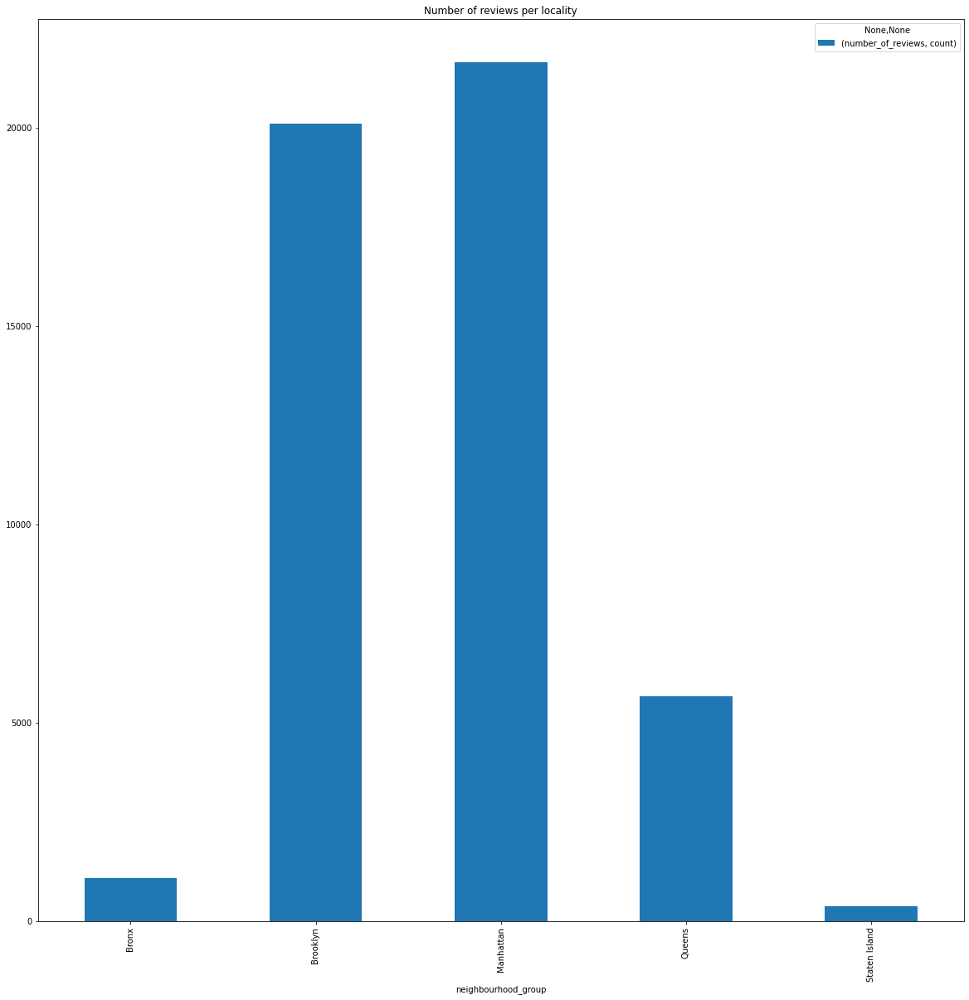

In [ ]:
# Number of reviews per Neighbourhood
pd.DataFrame(df[['neighbourhood_group', 'number_of_reviews']].groupby(['neighbourhood_group']).agg(['count'])).plot.bar(figsize = (20,20), title = "Number of reviews per locality")

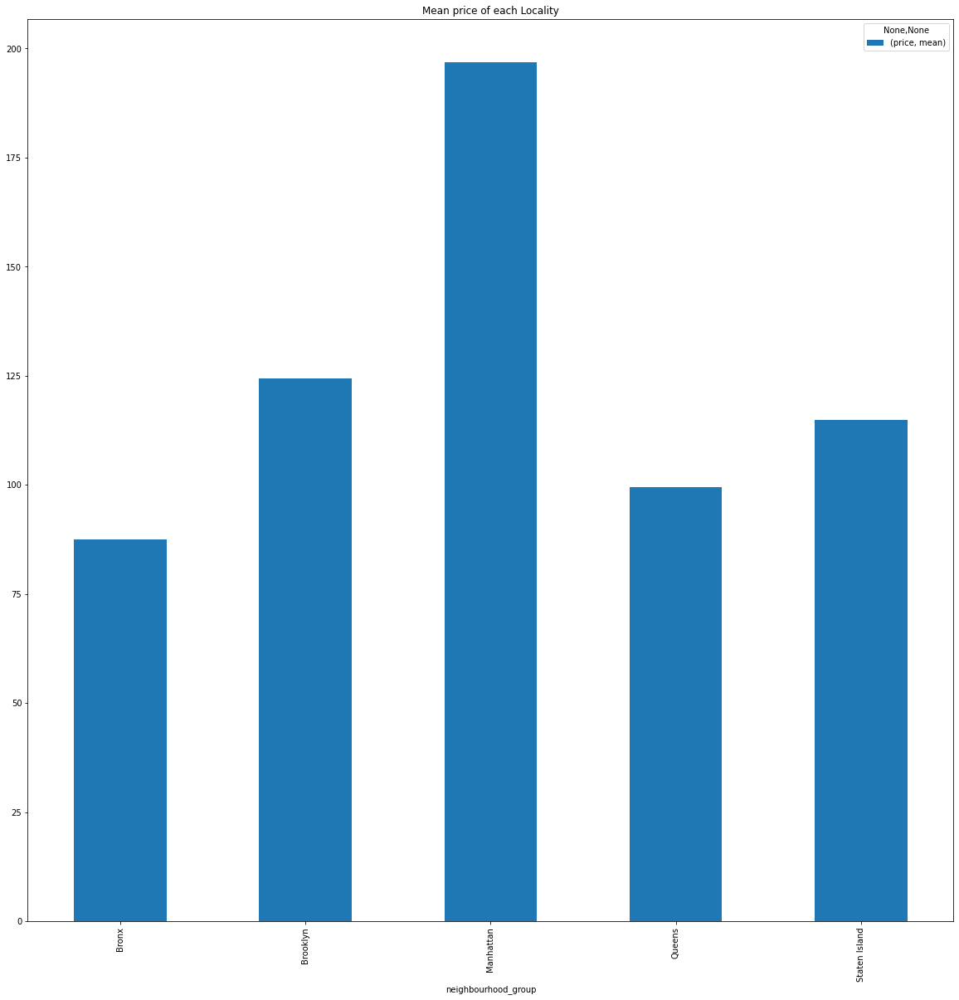

In [ ]:
# Costliest Neighborhoods(Groups)

a = pd.DataFrame(df[['neighbourhood_group', 'price']].groupby(['neighbourhood_group']).agg(['mean']))

a.plot.bar(figsize = (20,20), title = "Mean price of each Locality")

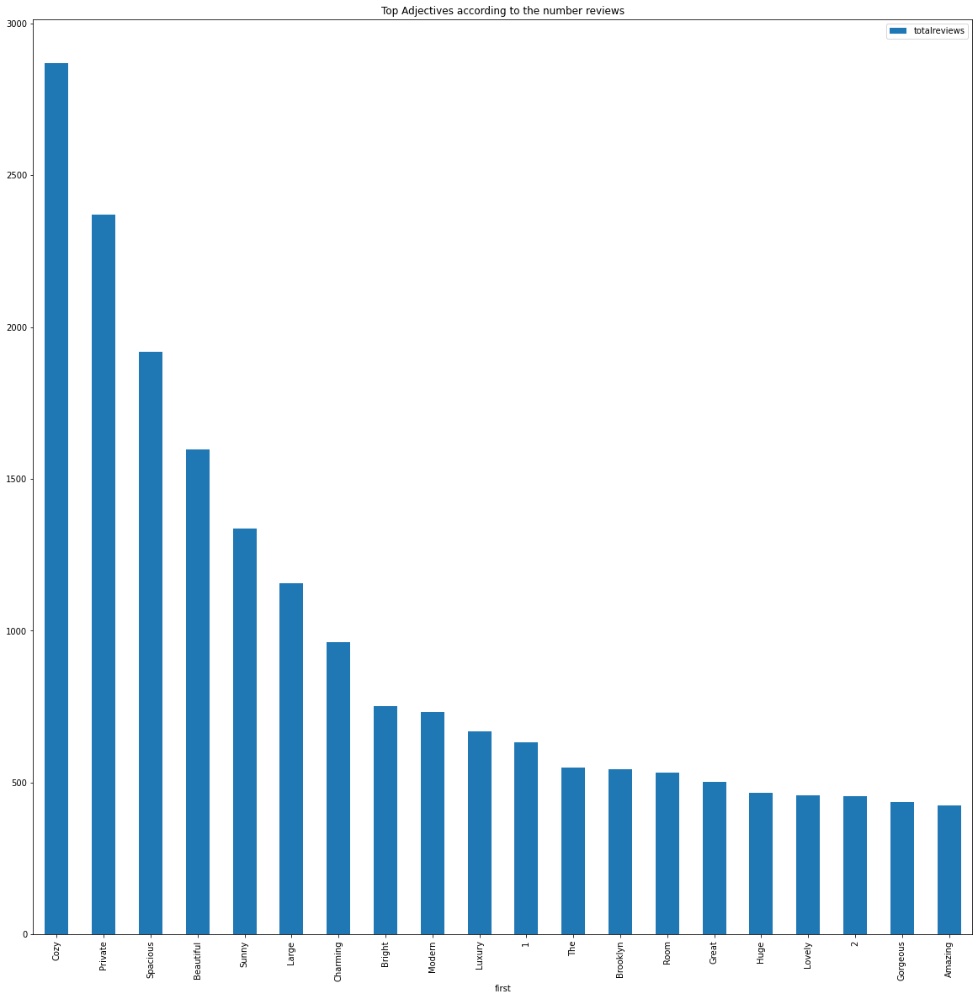

In [ ]:
## Which Adjectives(first word) received the most number of reviews 
word = pd.DataFrame(df[['first', 'number_of_reviews']].groupby(['first']).agg(['count']))
word.columns=['totalreviews']
adjective = word.nlargest(20, ['totalreviews']) 
adjective.plot.bar(figsize = (20,20), title = "Top Adjectives according to the number reviews")

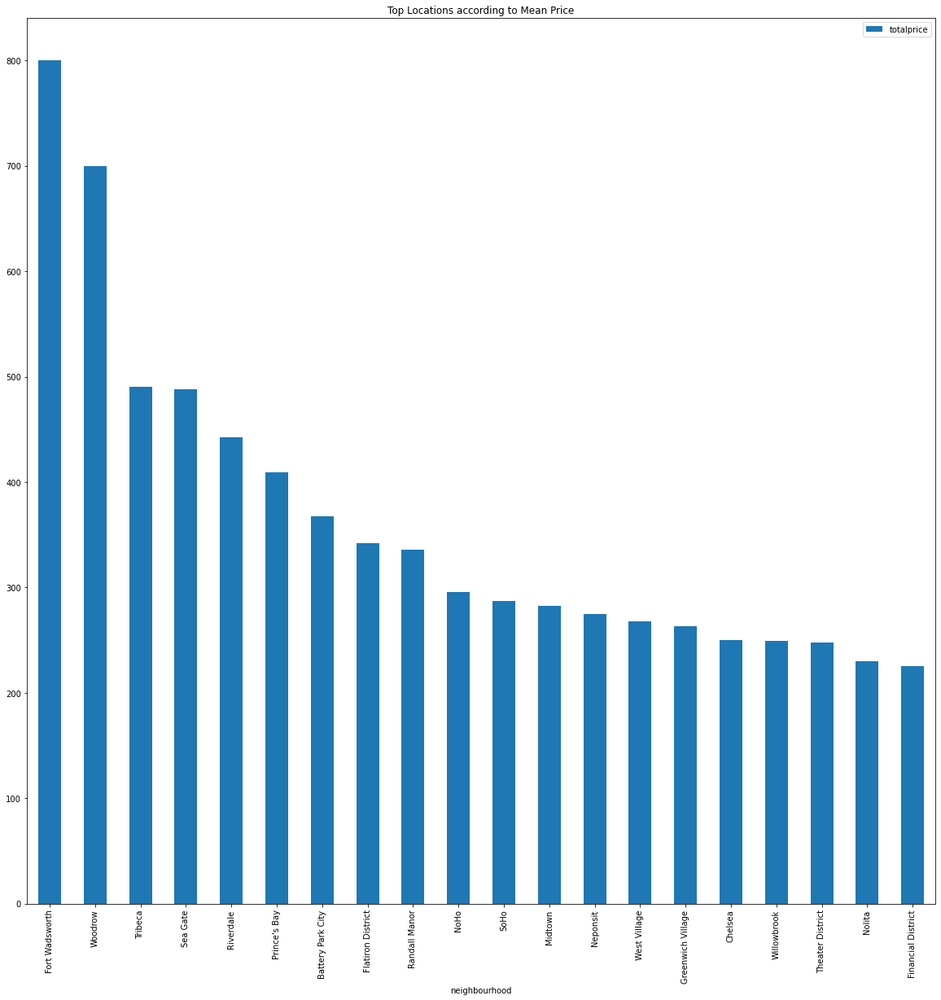

In [ ]:
## Top 20 Costliest Neighbourhoods(According to mean price)
word = pd.DataFrame(df[['neighbourhood', 'price']].groupby(['neighbourhood']).agg(['mean']))
word.columns=['totalprice']
adjective = word.nlargest(20, ['totalprice']) 
adjective.plot.bar(figsize = (20,20), title = "Top Locations according to Mean Price")

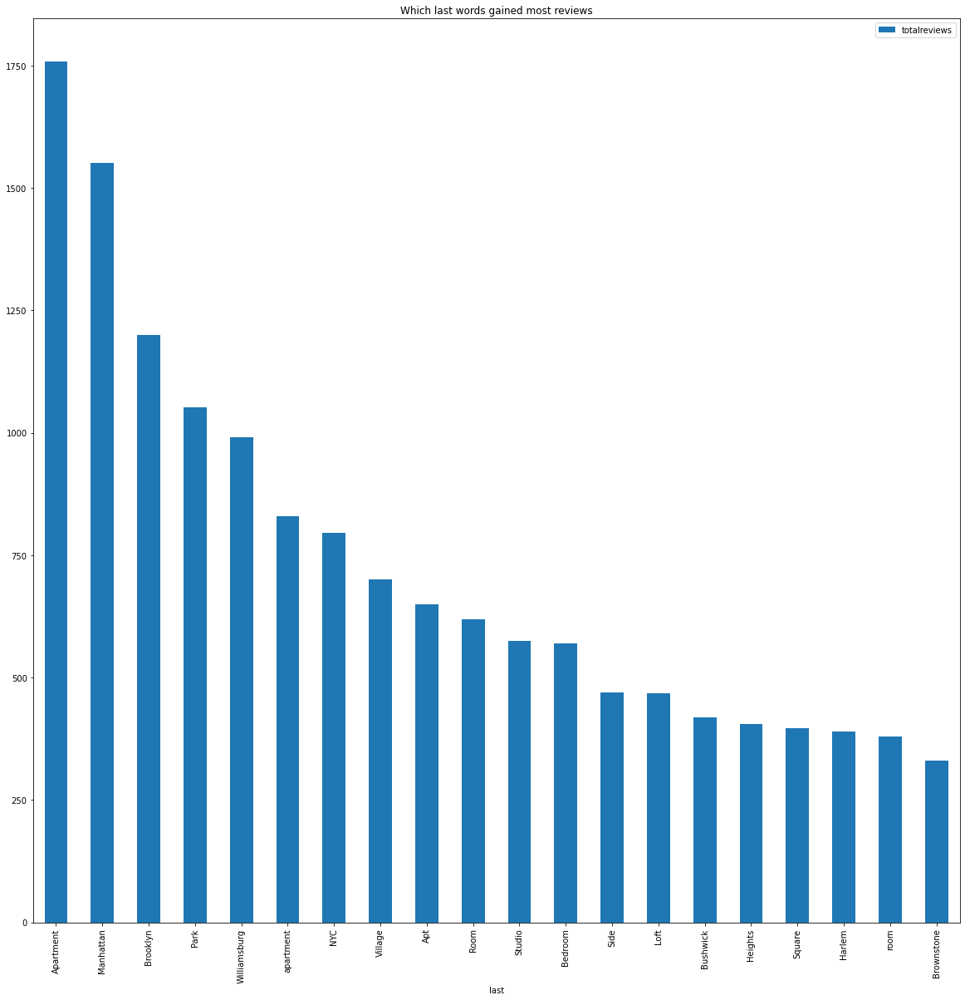

In [ ]:
# Does the last word tell us anything

word = pd.DataFrame(df[['last', 'number_of_reviews']].groupby(['last']).agg(['count']))
word.columns=['totalreviews']
adjective = word.nlargest(20, ['totalreviews']) 
adjective.plot.bar(figsize = (20,20), title = "Which last words gained most reviews")

## Owners often used the locality names to gain cutomers and for better reviews; for eg. "Affordable room in Bushwick/East Williamsburg" or "Trendy duplex in the very heart of Hell's Kitchen" 

In [ ]:
## Let us convert the object and string data types to first categorical type and then to integer for clustering

df['neighbourhood_group'] = df['neighbourhood_group'].astype('category')
df['neighbourhood_group'] = df['neighbourhood_group'].cat.codes

df['room_type'] = df['room_type'].astype('category')
df['room_type'] = df['room_type'].cat.codes

df['neighbourhood'] = df['neighbourhood'].astype('category')
df['neighbourhood'] = df['neighbourhood'].cat.codes

df['last'] = df['last'].astype('category')
df['last'] = df['last'].cat.codes

df['first'] = df['first'].astype('category')
df['first'] = df['first'].cat.codes

In [ ]:
X = np.array(df[['longitude', 'latitude', 'host_id', 'neighbourhood', 'neighbourhood_group', 'room_type', 'number_of_reviews', 'price', 'minimum_nights', 'calculated_host_listings_count', 'availability_365', 'last', 'first']], dtype='float64')


**6. *Creating the Clusters***

Text(0, 0.5, 'SSE')

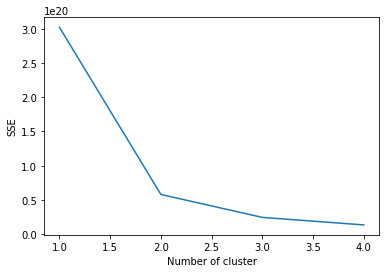

In [ ]:
## Making a column for clusters

X = np.array(df[['longitude', 'latitude', 'host_id', 'neighbourhood', 'neighbourhood_group', 'room_type', 'number_of_reviews', 'price', 'minimum_nights', 'calculated_host_listings_count', 'availability_365', 'last', 'first']])
sse = {}

for k in range(1, 5):

    kmeans = KMeans(n_clusters=k, random_state=17).fit(X)

    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center

plt.figure()

plt.plot(list(sse.keys()), list(sse.values()))

plt.xlabel("Number of cluster")

plt.ylabel("SSE")
    
    

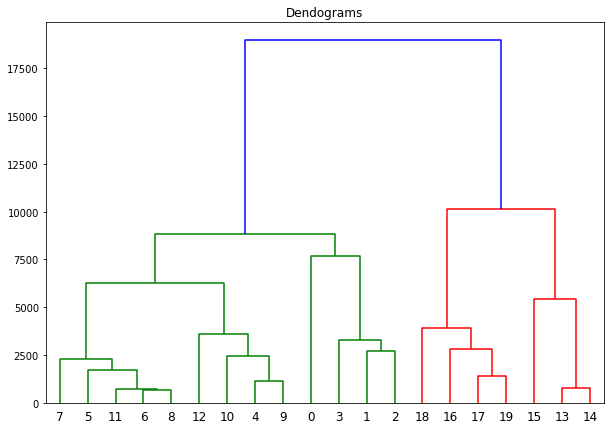

In [ ]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))
plt.title("Dendograms")
dend = shc.dendrogram(shc.linkage(X[:20,:], method='complete'))


In [ ]:
from sklearn.cluster import AgglomerativeClustering
length = 10000
class_predictions = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete').fit_predict(X[:length,:])
a= df.loc[:length-1,:].copy()
a[f'Cluster_'] = class_predictions

In [ ]:
## Check the clusters column
a

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,last,first,Cluster_
0,Clean & quiet apt home by the park,2787,1,108,40.64749,-73.97237,1,149,1,9,6,365,6907,1510,3
1,Skylit Midtown Castle,2845,2,127,40.75362,-73.98377,0,225,1,45,2,355,2011,4020,3
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,2,94,40.80902,-73.94190,1,150,3,0,1,365,0,4332,3
3,Cozy Entire Floor of Brownstone,4869,1,41,40.68514,-73.95976,0,89,1,270,1,194,1854,1644,3
4,Entire Apt: Spacious Studio/Loft by central park,7192,2,61,40.79851,-73.94399,0,80,10,9,1,0,6907,1941,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,Perfect Location - Meticulously Kept Flat,12620454,1,28,40.70442,-73.92484,0,220,5,27,1,0,2639,3484,1
9996,Garden Apt in Historic Brownstone!,2060383,1,43,40.68732,-73.99245,0,147,3,23,1,2,1855,2172,3
9997,East Village Private Room & Terrace,39956905,2,64,40.72811,-73.98453,1,95,2,1,2,0,5090,1887,2
9998,Cosy apartment in Carroll Gardens,33064750,1,31,40.68282,-73.99774,0,160,5,2,1,0,2769,1627,2


In [ ]:
# Plotting Locations
m = folium.Map(location=[a.latitude.mean(), a.longitude.mean()], zoom_start = 10, tiles = 'Open Street Map')

colors = ["#FF2D00", "#33FF00", "#0021FF", "#FF00F3"]
for _, row in a.iterrows():
    folium.CircleMarker(location=[row.latitude, row.longitude],
                       radius = 4, 
                       popup = str(row.name),
                       color = colors[row['Cluster_']],
                       fill = True,
                        fill_color = colors[row['Cluster_']]).add_to(m)
    
m    